In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

In [2]:
Beads_range=[x for x in range(10,50,4) if x not in (38,46)] # # # #    monomer's range
Dens_range=[x/100 for x in range(0,81,5) if x>0] # # # #    dens' range
Frac_range=[x/100 for x in range(0,100,25) if x!=0] # # # #    frac' range

In [3]:
cols = ['Pair Separation Distance', '0-0', '0-1','1-1','NaN']

In [4]:
def Data(bead, frac, dens):
    data = pd.read_table('./results/snapshots/coordination_analysis/f_'+str(frac)+'/b_'+str(bead)+'/d_'+str(dens)+'.txt', delim_whitespace=True, header=1)
    data.columns = ['Pair Separation Distance', '0-0', '0-1','1-1','NaN']
    data = data.drop(columns='NaN')
    return data

In [5]:
def RDFer(Beads, Fracs, Dens):
    
    Fracs = [int((1-f)*10%10) for f in Fracs]
    
    Fracs.reverse()

    for Frac in Fracs:
        
        for Bead in Beads:
            for D in Dens:
                
                x = Data(Bead, Frac, D)['Pair Separation Distance']

                y00=[(s+0.2) for s in Data(Bead, Frac, D)['0-0']]; plt.plot(x,y00,label='0-0'); 
                y01=[(s-0.4) for s in Data(Bead, Frac, D)['0-1']]; plt.plot(x,y01,label='0-1'); 
                y11=[(s-0.4) for s in Data(Bead, Frac, D)['1-1']]; plt.plot(x,y11,label='1-1');

                plt.xlabel("G(r)"); plt.ylabel('r');
                #plt.title("polymers with $f_{A}$ ~ "+str(f)+"");
                plt.title(str(Bead)+" beads, dens "+str(D)+", and frac "+str(Frac))
                plt.legend(loc=0, ncol=2);
                plt.savefig('./results/snapshots/coordination_analysis/f_'+str(Frac)+'/b_'+str(Bead)+'/d_'+str(D)+'.png');
                plt.show() 

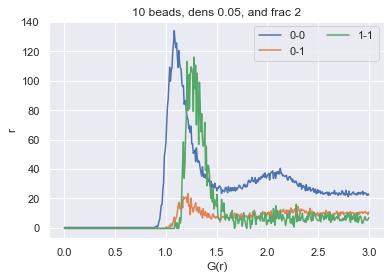

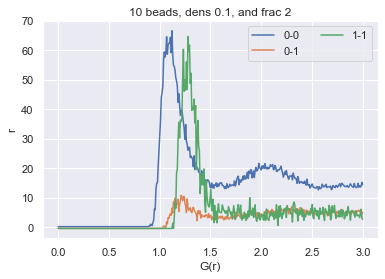

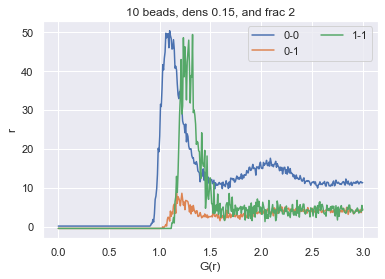

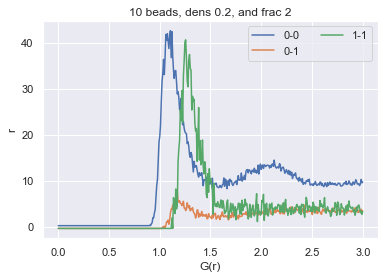

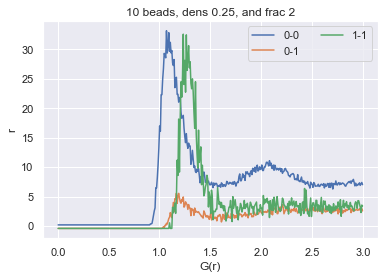

...

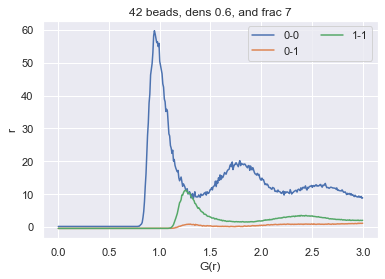

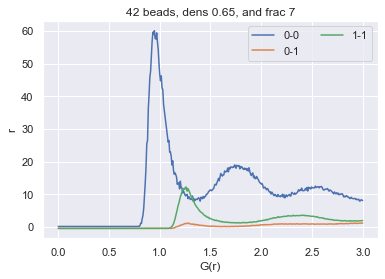

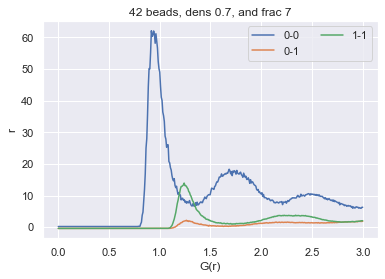

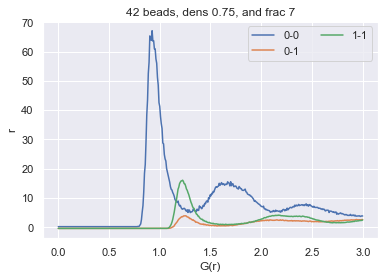

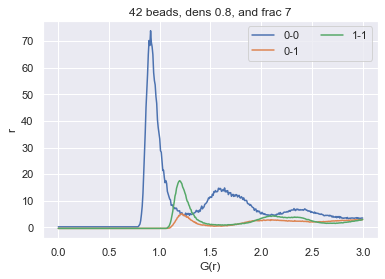

In [6]:
RDFer(Beads_range, Frac_range, Dens_range)